In [31]:
import pandas as pd
import numpy as np
import matplotlib as plt
%matplotlib inline
import seaborn as sb
from pandas_profiling import ProfileReport
import sweetviz as sv

In [35]:
from pylab import rcParams
rcParams['figure.figsize'] = 10,6
sb.set_style('whitegrid')

In [28]:
df = pd.read_csv('df_hotel.csv')

In [29]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


# Data Dictionary
| variable       | class         | description  |
| -------------  |:-------------:| -----:       |
| hotel	         |	character   | Hotel (H1 = Resort Hotel or H2 = City Hotel)|
| is_canceled    | double       |  Value indicating if the booking was canceled (1) or not (0) |
| lead_time      | double       |    Number of days that elapsed between the entering date of the booking into the PMS and the arrival date |
|arrival_date_year| double      |Year of arrival date|
|arrival_date_month|character   |Month of arrival date|
|arrival_date_week_number|	double|	Week number of year for arrival date|
|arrival_date_day_of_month|	double |	Day of arrival date|
|stays_in_weekend_nights|	double	|Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
|stays_in_week_nights|	double	|Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel
|adults	|double|	Number of adults|
|children|	double|	Number of children|
|babies|	double|	Number of babies|
|meal	|character|	Type of meal booked Categories are presented in standard hospitality meal packages:
|country|	character|	Country of origin.Categories are represented in the ISO 3155–3:2013 format
|market_segment	|character|	Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators”|
|distribution_channel|	character	|Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators”|
|is_repeated_guest|	double|	Value indicating if the booking name was from a repeated guest (1) or not (0)|
|previous_cancellations|	double	|Number of previous bookings that were cancelled by the customer prior to the current booking|
|previous_bookings_not_canceled|	double	|Number of previous bookings not cancelled by the customer prior to the current booking|
|reserved_room_type|	character|	Code of room type reserved. Code is presented instead of designation for anonymity reasons|
|assigned_room_type|	character|	Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request. Code is presented instead of designation for anonymity reasons|
|booking_changes	|double|	Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation|
|deposit_type|	character|	Indication on if the customer made a deposit to guarantee the booking. This variable can assume three categories:No Deposit – no deposit was made; Non Refund – a deposit was made in the value of the total stay cost;Refundable – a deposit was made with a value under the total cost of stay.|
|agent	|character	|ID of the travel agency that made the booking|
|company|	character	|ID of the company/entity that made the booking or responsible for paying the booking. ID is presented instead of designation for anonymity reasons|
|days_in_waiting_list|	double	|Number of days the booking was in the waiting list before it was confirmed to the customer|
|Customer_type|	character	|Type of booking, assuming one of four categories:Contract - when the booking has an allotment or other type of contract associated to it;Group – when the booking is associated to a group;Transient – when the booking is not part of a group or contract, and is not associated to other transient booking;Transient-party – when the booking is transient, but is associated to at least other transient booking|
|adr	|double	|Average Daily Rate as defined by dividing the sum of all lodging transactions by the total number of staying nights|
|required_car_parking_spaces|	double	|Number of car parking spaces required by the customer|
|total_of_special_requests|	double	|Number of special requests made by the customer (e.g. twin bed or high floor)
|reservation_status	|character|	Reservation last status, assuming one of three categories:Canceled – booking was canceled by the customer;Check-Out – customer has checked in but already departed;No-Show – customer did not check-in and did inform the hotel of the reason why
|reservation_status_date|	double	|Date at which the last status was set. This variable can be used in conjunction with the ReservationStatus to understand when was the booking canceled or when did the customer checked-out of the hotel

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [7]:
#Some missing records in Country , agent and company
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [17]:
profile = ProfileReport(df, title = 'Hotel Data Profile')

In [18]:
profile

In [25]:
#Saving Profile in html 
profile.to_file("Hotel_report.html")

In [8]:
df.duplicated().sum()

31994

In [9]:
#Removing all duplicates from df
df.drop_duplicates(inplace=True)

In [18]:
df.to_csv('df_hotel.csv', index=False)

In [12]:
df.country.value_counts()[:10]

PRT    27453
GBR    10433
FRA     8837
ESP     7252
DEU     5387
ITA     3066
IRL     3016
BEL     2081
BRA     1995
NLD     1911
Name: country, dtype: int64

In [26]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,87396.000000,87396.000000,87396.000000,87396.000000,87396.000000,87396.000000,87396.000000,87396.000000,87392.000000,87396.000000,87396.000000,87396.000000,87396.000000,87396.000000,75203.000000,5259.000000,87396.000000,87396.000000,87396.000000,87396.000000
mean,0.274898,79.891368,2016.210296,26.838334,15.815541,1.005263,2.625395,1.875795,0.138640,0.010824,0.039075,0.030413,0.183990,0.271603,94.138306,183.081384,0.749565,106.337246,0.084226,0.698567
std,0.446466,86.052325,0.686102,13.674572,8.835146,1.031921,2.053584,0.626500,0.455881,0.113597,0.193775,0.369145,1.731894,0.727245,113.188172,130.557608,10.015731,55.013953,0.281533,0.831946
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,11.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,47.000000,0.000000,72.000000,0.000000,0.000000
50%,0.000000,49.000000,2016.000000,27.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,169.000000,0.000000,98.100000,0.000000,0.000000
75%,1.000000,125.000000,2017.000000,37.000000,23.000000,2.000000,4.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,240.000000,263.000000,0.000000,134.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


In [28]:
# selecting Columns of categorical features
df.select_dtypes(include='object')

,hotel,arrival_date_month,meal,country,market_segment,distribution_channel,reserved_room_type,assigned_room_type,deposit_type,customer_type,reservation_status,reservation_status_date
0,Resort Hotel,July,BB,PRT,Direct,Direct,C,C,No Deposit,Transient,Check-Out,2015-07-01
1,Resort Hotel,July,BB,PRT,Direct,Direct,C,C,No Deposit,Transient,Check-Out,2015-07-01
2,Resort Hotel,July,BB,GBR,Direct,Direct,A,C,No Deposit,Transient,Check-Out,2015-07-02
3,Resort Hotel,July,BB,GBR,Corporate,Corporate,A,A,No Deposit,Transient,Check-Out,2015-07-02
4,Resort Hotel,July,BB,GBR,Online TA,TA/TO,A,A,No Deposit,Transient,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,August,BB,BEL,Offline TA/TO,TA/TO,A,A,No Deposit,Transient,Check-Out,2017-09-06
119386,City Hotel,August,BB,FRA,Online TA,TA/TO,E,E,No Deposit,Transient,Check-Out,2017-09-07
119387,City Hotel,August,BB,DEU,Online TA,TA/TO,D,D,No Deposit,Transient,Check-Out,2017-09-07
119388,City Hotel,August,BB,GBR,Online TA,TA/TO,A,A,No Deposit,Transient,Check-Out,2017-09-07


In [32]:
# using Sweetviz Library to display some visualization
my_report =sv.analyze(df)

In [33]:
my_report.show_html()

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [44]:
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

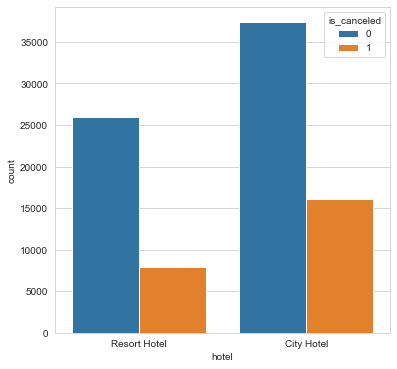

In [33]:
sb.countplot(x='hotel', hue='is_canceled', data=df);

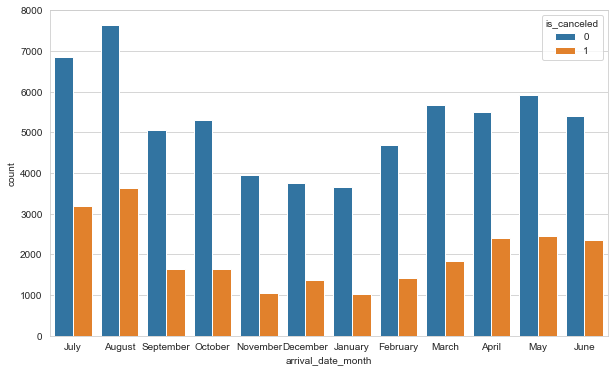

In [36]:
sb.countplot(x = 'arrival_date_month', hue='is_canceled', data=df)

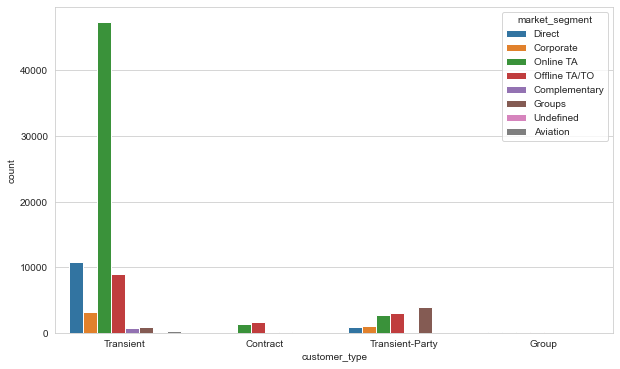

In [45]:
sb.countplot(x='customer_type',hue='market_segment', data=df)

In [46]:
df.to_csv('df_hotel.csv', index=False)